In [1]:
import torch

import matplotlib.pyplot as plt
import numpy as np

import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable

from transformers import BertTokenizer, BertModel
from torch.utils.data import DataLoader
from torchtext.data.functional import to_map_style_dataset
from torchtext.datasets import AG_NEWS

from tqdm import tqdm

from bert import EncodedDataset

from bertviz import model_view

In [2]:
device = torch.device("cpu")

batch_size = 16
num_epochs = 64
max_len = 64
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')


train_iter = AG_NEWS(split='train')
trainset = to_map_style_dataset(train_iter)

trainset = EncodedDataset(trainset, tokenizer, max_len, device)

test_iter = AG_NEWS(split='test')
testset = to_map_style_dataset(test_iter)
testset = EncodedDataset(testset[:500], tokenizer, max_len, device)
testloader = DataLoader(testset, batch_size=batch_size, shuffle=False)

print(f"train set loaded - test: {len(testset)}")


/usr/venv/545bert/lib/python3.8/site-packages/torch/utils/data/datapipes/utils/common.py:24: UserWarning: Lambda function is not supported for pickle, please use regular python function or functools.partial instead.
  warnings.warn(


train set loaded - test: 500


In [3]:
class Classifier_model(nn.Module):
    def __init__(self):
        super().__init__()

        self.bert = BertModel.from_pretrained('bert-base-uncased', output_attentions=True)
        self.embedding = self.bert.embeddings
        self.dropout = nn.Dropout(0.1)
        self.fc1 = nn.Linear(768, 10) # 768 x 10
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(10, 4)
        self.softmax = nn.Softmax(1)

    def forward(self, inbatch):
        output = self.bert(inbatch['ids'], attention_mask=inbatch['mask'], token_type_ids=inbatch['token_type_ids'])
        output = output.pooler_output
        output = self.dropout(output)
        output = self.fc1(output)
        output = self.relu(output)
        output = self.fc2(output)

        return output
    
    def forward2(self, inbatch):
        bert_output = self.bert.forward(inbatch['ids'], attention_mask=inbatch['mask'], token_type_ids=inbatch['token_type_ids'], output_attentions=True)
        print(bert_output.keys())
        output = bert_output.pooler_output

        output = self.dropout(output)
        output = self.fc1(output)
        output = self.relu(output)
        output = self.fc2(output)
        output = self.softmax(output)
        return output, bert_output.attentions
    
    def forward_noemb(self, emb_data, mask):
        output = self.bert.forward(inputs_embeds=emb_data, attention_mask=mask)
        output = output.pooler_output
        output = self.dropout(output)
        output = self.fc1(output)
        output = self.relu(output)
        output = self.fc2(output)
        #output = self.softmax(output)
        return output

In [4]:
model = torch.load('saved_bert', map_location=torch.device('cpu'))

In [5]:
def get_toks(text, label, tokenizer, device):
    inputs = tokenizer(
        text,
        None,
        add_special_tokens=True,
        max_length=64,
        padding='max_length',
        return_token_type_ids=True,
        truncation=True
    )

    ids = inputs['input_ids']
    mask = inputs['attention_mask']
    token_type_ids = inputs["token_type_ids"]

    return {
        'ids': torch.tensor(ids, dtype=torch.long).unsqueeze(0).to(device, dtype=torch.long),
        'mask': torch.tensor(mask, dtype=torch.long).unsqueeze(0).to(device, dtype=torch.long),
        'token_type_ids': torch.tensor(token_type_ids, dtype=torch.long).unsqueeze(0).to(device, dtype=torch.long),
        'targets': torch.tensor(label, dtype=torch.long).reshape(1,1).to(device, dtype=torch.long)
    }

In [6]:
idx2label = {0: 'World', 1: 'Sports', 2: 'Business', 3: 'Sci/Tec'}
data_sample = 0
tp = get_toks("AMD and IBM have extended their CPU technology agreement through the end of 2008. Originally signed in December 2002, the alliance was originally slated to wind up at the end of 2005.", 3, tokenizer, device)
lab = idx2label[3]
untoked = tokenizer.convert_ids_to_tokens(tp['ids'].flatten())

#untoked = tokenizer.decode(tp['ids'].flatten(), clean_up_tokenization_spaces=True).split()

In [7]:
untoked

['[CLS]',
 'am',
 '##d',
 'and',
 'ibm',
 'have',
 'extended',
 'their',
 'cpu',
 'technology',
 'agreement',
 'through',
 'the',
 'end',
 'of',
 '2008',
 '.',
 'originally',
 'signed',
 'in',
 'december',
 '2002',
 ',',
 'the',
 'alliance',
 'was',
 'originally',
 'slated',
 'to',
 'wind',
 'up',
 'at',
 'the',
 'end',
 'of',
 '2005',
 '.',
 '[SEP]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]',
 '[PAD]']

In [8]:
outputs, attention = model.forward2(tp)  # Run model
#attention = outputs[-1]

odict_keys(['last_hidden_state', 'pooler_output', 'attentions'])


In [9]:
model_view(attention=attention, tokens=untoked)

<IPython.core.display.Javascript object>

In [11]:
len(attention)

12

In [13]:
attention[0].shape

torch.Size([1, 12, 64, 64])

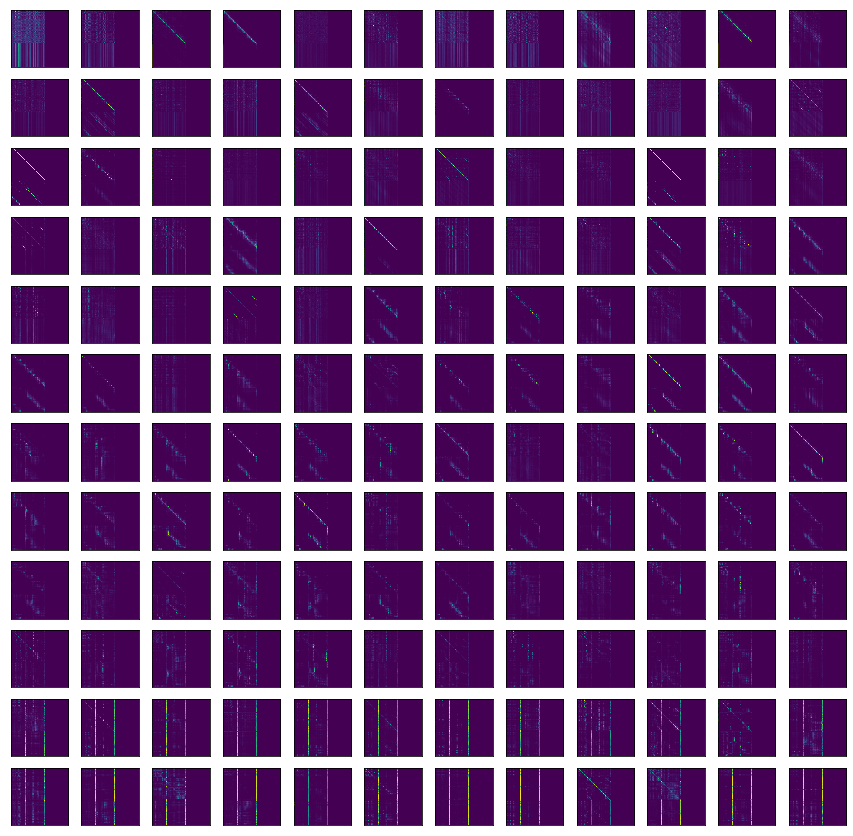

In [58]:
figure, axis = plt.subplots(12,12, figsize=(15,15))
for i in range(len(attention)):
    for j in range(attention[i].shape[1]):
        cax = axis[i,j].matshow(attention[i][0,j])
        axis[i,j].set_xticks([])
        axis[i,j].set_yticks([])
#         xaxis = np.arange(len(untoked[1:sepidx]))
#         axis[i,j].set_xticks(xaxis)
#         axis[i,j].set_yticks(xaxis)
#         axis[i,j].set_xticklabels(untoked[1:sepidx])
#         axis[i,j].set_yticklabels(untoked[1:sepidx])
#         plt.xticks(rotation=90)


In [14]:
agg_att = torch.zeros(attention[0].shape)

In [17]:
for attmat in attention:
    agg_att += attmat

In [18]:
model_view(attention=(agg_att,), tokens=untoked)

<IPython.core.display.Javascript object>

In [23]:
one_att = torch.sum(agg_att, axis=1)

In [24]:
one_att.shape

torch.Size([1, 64, 64])

In [25]:
one_att = one_att.squeeze()

In [26]:
one_att.shape

torch.Size([64, 64])

In [48]:
sepidx = untoked.index('[SEP]')

In [49]:
sepidx

37

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35]),
 [Text(0, 1, 'am'),
  Text(1, 1, '##d'),
  Text(2, 1, 'and'),
  Text(3, 1, 'ibm'),
  Text(4, 1, 'have'),
  Text(5, 1, 'extended'),
  Text(6, 1, 'their'),
  Text(7, 1, 'cpu'),
  Text(8, 1, 'technology'),
  Text(9, 1, 'agreement'),
  Text(10, 1, 'through'),
  Text(11, 1, 'the'),
  Text(12, 1, 'end'),
  Text(13, 1, 'of'),
  Text(14, 1, '2008'),
  Text(15, 1, '.'),
  Text(16, 1, 'originally'),
  Text(17, 1, 'signed'),
  Text(18, 1, 'in'),
  Text(19, 1, 'december'),
  Text(20, 1, '2002'),
  Text(21, 1, ','),
  Text(22, 1, 'the'),
  Text(23, 1, 'alliance'),
  Text(24, 1, 'was'),
  Text(25, 1, 'originally'),
  Text(26, 1, 'slated'),
  Text(27, 1, 'to'),
  Text(28, 1, 'wind'),
  Text(29, 1, 'up'),
  Text(30, 1, 'at'),
  Text(31, 1, 'the'),
  Text(32, 1, 'end'),
  Text(33, 1, 'of'),
  Text(34, 1, '2005'),
  Text(35, 1, '.')])

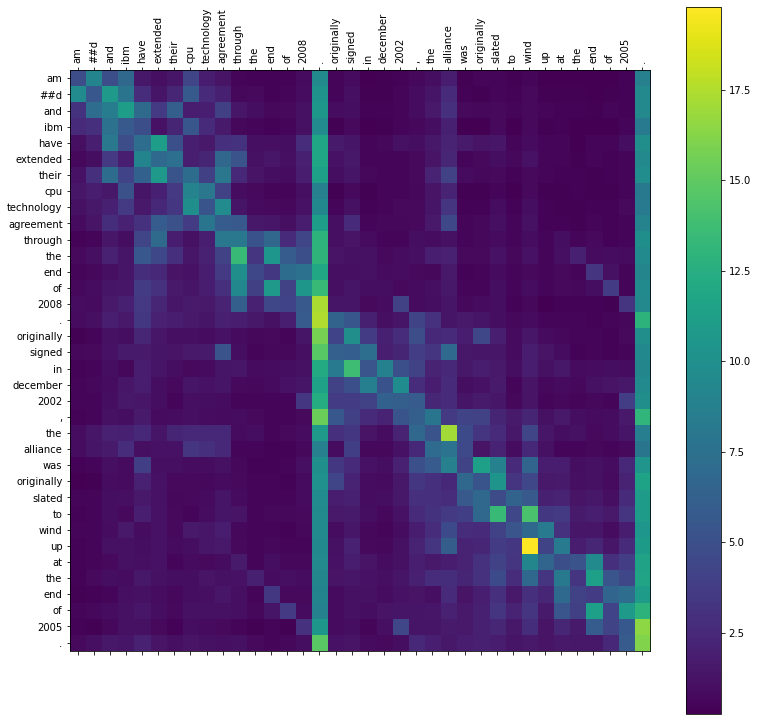

In [51]:
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(111)
cax = ax.matshow(one_att[1:sepidx,1:sepidx])
fig.colorbar(cax)

xaxis = np.arange(len(untoked[1:sepidx]))
ax.set_xticks(xaxis)
ax.set_yticks(xaxis)
ax.set_xticklabels(untoked[1:sepidx])
ax.set_yticklabels(untoked[1:sepidx])
plt.xticks(rotation=90)

#plt.matshow(one_att, fignum=1)